# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

### Business Understanding : Use the dataset to unterstand the correlation between various features/attributes of used car and the price and identify the key drivers. This helps the business to predict the price of a car based on its features so that they can make informed decisions in setting the sale price of used cars and in procuring more cars for resale.

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import random
import plotly.express as px
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.preprocessing import StandardScaler, PolynomialFeatures


In [55]:
data = pd.read_csv('data/vehicles.csv')

In [ ]:
data.head(100)

In [ ]:
data

In [ ]:
data.describe(include="all")

In [ ]:
data.isnull().sum()

In [ ]:
data.isna().sum()

#### Data Understanding
The data in this dataset is tabular, with rows and columns, where each row represents a specific used car listing, and each column represents a particular attribute or feature of these cars.

Features:

Region,
Price,
Year,
Manufacturer,
Model,
Condition,
cylinders,
fuel,
odometer,
title_status,
transmission,
VIN,
drive,
size,
type,
paint_color,
state

Some features are catergorical values (eg: title_status) and some are continuous values (eg: odometer).
There are a total of 426879 entries in the dataset but several of them has null/nan values for at-least one column

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [ ]:
#drop nan
#data = data.dropna()

In [ ]:
data

In [ ]:
num_na = pd.DataFrame({'num_na':data.isna().sum(),'%':data.isna().sum()/len(data)})
num_na

In [56]:
#Some columsn like VIN, size, drive, paint_color, condition and cylinders have >30% of missing values. Drop these columns
data.drop(['id', 'VIN', 'size', 'drive', 'paint_color', 'condition', 'cylinders'], axis=1, inplace=True)

In [ ]:
#examine the remaining features
data['model'].unique()
data['model'].tail()

In [57]:
#drop model column as it contains open ended text and has too many possible values
data.drop(['model'], axis=1, inplace=True)
#drop rows with na values
data=data.dropna()

In [ ]:
data.head()

In [ ]:
sns.countplot(data, x='year')
plt.xticks(rotation=90)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'gas'),
  Text(1, 0, 'other'),
  Text(2, 0, 'diesel'),
  Text(3, 0, 'hybrid'),
  Text(4, 0, 'electric')])

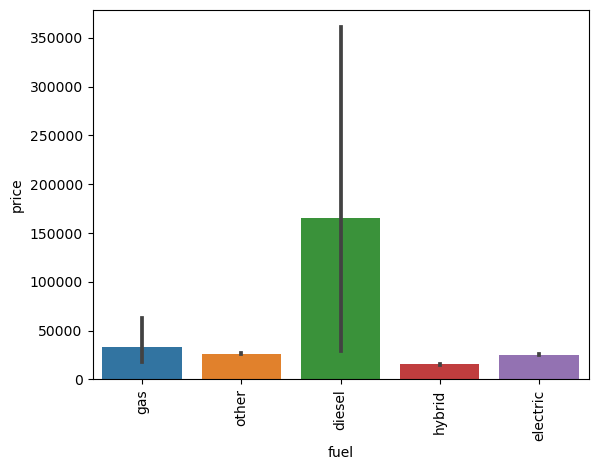

In [58]:
sns.barplot(data, x='fuel', y='price')
plt.xticks(rotation=90)


In [ ]:
sns.countplot(data, x='fuel')
plt.xticks(rotation=90)

In [ ]:
sns.barplot(data, x='manufacturer', y='price')
plt.xticks(rotation=90)

In [ ]:
data.query("price > 100000 and price < 200000")

In [ ]:
data.query("price > 200000")

In [ ]:
price_outliers = data.loc[data['price'] > 1000000]
price_outliers

In [ ]:
data.drop(price_outliers.index, axis=0, inplace=True)
px.line(data.groupby("year").agg('mean')[["price"]])

In [ ]:
odometer_outliers = data.loc[data['odometer'] > 1000000]
odometer_outliers

In [ ]:
data.drop(odometer_outliers.index, axis=0, inplace=True)
px.line(data.groupby("year").agg('mean')[["odometer"]])

In [ ]:
fig = px.box(data, x="manufacturer", y="price")
fig.show()

In [59]:
fig = px.box(data, x="type", y="price")
fig.show()

In [ ]:
fig = px.box(data, x="title_status", y="price")
fig.show()

In [ ]:
fig = px.box(data, x="region", y="price")
fig.show()

In [ ]:
fig = px.box(data, x="state", y="price")
fig.show()

In [61]:
data.drop(['region'], axis=1, inplace=True)

In [62]:
data.drop(['state'], axis=1, inplace=True)
data.head()

,price,year,manufacturer,fuel,odometer,title_status,transmission,type
27,33590,2014.0,gmc,gas,57923.0,clean,other,pickup
28,22590,2010.0,chevrolet,gas,71229.0,clean,other,pickup
29,39590,2020.0,chevrolet,gas,19160.0,clean,other,pickup
30,30990,2017.0,toyota,gas,41124.0,clean,other,pickup
31,15000,2013.0,ford,gas,128000.0,clean,automatic,truck


In [63]:
df = pd.get_dummies(data)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 309826 entries, 27 to 426879
Data columns (total 72 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   price                         309826 non-null  int64  
 1   year                          309826 non-null  float64
 2   odometer                      309826 non-null  float64
 3   manufacturer_acura            309826 non-null  uint8  
 4   manufacturer_alfa-romeo       309826 non-null  uint8  
 5   manufacturer_aston-martin     309826 non-null  uint8  
 6   manufacturer_audi             309826 non-null  uint8  
 7   manufacturer_bmw              309826 non-null  uint8  
 8   manufacturer_buick            309826 non-null  uint8  
 9   manufacturer_cadillac         309826 non-null  uint8  
 10  manufacturer_chevrolet        309826 non-null  uint8  
 11  manufacturer_chrysler         309826 non-null  uint8  
 12  manufacturer_datsun           309826 non-nu

In [ ]:
df.head(100)

In [ ]:
df.corr()["price"]["fuel_diesel"]

In [64]:
#Split data into training and test data
y = df['price']
X = df.drop('price', axis = 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,shuffle = True)
print(len(X_train))
print(len(X_test))

216878
92948


# Data Preparation
1. Cleaned the dataset by removing the columns that have missing/nan values in more than 30%
2. Deleted the model column  as it contains open ended text and has too many possible values, likely uninformative
3. Checked and removed the outliers for Price and Odometer columns (>1000000)
4. Deleted the "Region" and "State" columns as they seem to have too many possible values and less correlation to the price
5. Converted categorical variables into dummy/indicator variables using pandas.get_dummies
6. Split the dataset into Train and Test datasets

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [65]:
#Sequential Feature Selection 

feature_select = SequentialFeatureSelector(estimator = LinearRegression(),
                                           n_features_to_select = 5)
best_five = pd.DataFrame(feature_select.fit_transform(X_train, y_train), 
                         columns = feature_select.get_feature_names_out())
print(best_five)

        manufacturer_ferrari  manufacturer_gmc  manufacturer_mercury  \
0                        0.0               1.0                   0.0   
1                        0.0               0.0                   0.0   
2                        0.0               0.0                   0.0   
3                        0.0               0.0                   0.0   
4                        0.0               0.0                   0.0   
...                      ...               ...                   ...   
216873                   0.0               0.0                   0.0   
216874                   0.0               0.0                   0.0   
216875                   0.0               0.0                   0.0   
216876                   0.0               0.0                   0.0   
216877                   0.0               0.0                   0.0   

        manufacturer_nissan  manufacturer_saturn  
0                       0.0                  0.0  
1                       0.0      

In [66]:
#Linear Regression Model
lm_model = LinearRegression()
lm_model.fit(X_train, y_train)

param_df = pd.DataFrame([lm_model.coef_])
print(param_df)

train_mse_lm = mean_squared_error(lm_model.predict(X_train), y_train)                  
test_mse_lm = mean_squared_error(lm_model.predict(X_test), y_test)
print(f'Train MSE: {train_mse_lm}')
print(f'Test MSE: {test_mse_lm}')

            0         1            2             3             4   \
0 -3041.031351 -0.033167  7434.130872  17500.089677  54760.487076   

             5            6             7            8            9   ...  \
0  15254.166419  8308.597003  42014.105237  5102.718315 -5303.652808  ...   

            61            62            63             64           65  \
0  2840.960144  15924.183213  21295.103393 -132015.170403  4818.819226   

             66           67            68            69            70  
0  54311.480473  22434.05888 -15779.180932  25622.642236  14479.137991  

[1 rows x 71 columns]
Train MSE: 15154045342677.227
Test MSE: 150246069209484.16


In [67]:

feature_select = SequentialFeatureSelector(estimator = Lasso(),
                                           n_features_to_select = 5)
best_five = pd.DataFrame(feature_select.fit_transform(X_train, y_train), 
                         columns = feature_select.get_feature_names_out())
print(best_five)

        manufacturer_ferrari  manufacturer_gmc  manufacturer_mercury  \
0                        0.0               1.0                   0.0   
1                        0.0               0.0                   0.0   
2                        0.0               0.0                   0.0   
3                        0.0               0.0                   0.0   
4                        0.0               0.0                   0.0   
...                      ...               ...                   ...   
216873                   0.0               0.0                   0.0   
216874                   0.0               0.0                   0.0   
216875                   0.0               0.0                   0.0   
216876                   0.0               0.0                   0.0   
216877                   0.0               0.0                   0.0   

        manufacturer_nissan  manufacturer_saturn  
0                       0.0                  0.0  
1                       0.0      

In [ ]:
#Lasso Regression Model
lm_model = Lasso()
lm_model.fit(X_train, y_train)

param_df = pd.DataFrame([lm_model.coef_])
print(param_df)

train_mse_lm = mean_squared_error(lm_model.predict(X_train), y_train)                  
test_mse_lm = mean_squared_error(lm_model.predict(X_test), y_test)
print(f'Train MSE: {train_mse_lm}')
print(f'Test MSE: {test_mse_lm}')

In [ ]:
feature_select = SequentialFeatureSelector(estimator = Ridge(alpha = 1000),
                                           n_features_to_select = 5)
best_five = pd.DataFrame(feature_select.fit_transform(X_train, y_train), 
                         columns = feature_select.get_feature_names_out())
print(best_five)

In [ ]:
#Ridge Regression
lm_ridge_model = Ridge(alpha = 1000)
lm_ridge_model.fit(X_train, y_train)

param_ridge_df = pd.DataFrame([lm_ridge_model.coef_])
print(param_ridge_df)

train_mse_ridge = mean_squared_error(lm_ridge_model.predict(X_train), y_train)                  
test_mse_ridge = mean_squared_error(lm_ridge_model.predict(X_test), y_test)
print(f'Train MSE: {train_mse_ridge}')
print(f'Test MSE: {test_mse_ridge}')

In [ ]:
total_indices = list(range(0, len(df)))
training_indices, dev_indices = np.split(total_indices, [len(X_train)])
print(len(training_indices))
print(len(dev_indices))


In [ ]:

#find best Ridge Regression model using GridSearchCV
scaled_ridge_model = Pipeline([('scale', StandardScaler()),
                               ('regression', Ridge())
                              ])
parameters_to_try = {'regression__alpha' : 10**np.linspace(-2, 5, 100)}
model_finder = GridSearchCV(estimator = scaled_ridge_model, 
                            param_grid = parameters_to_try,
                            scoring = "neg_mean_squared_error",
                            cv = [[training_indices, dev_indices]])
model_finder.fit(X, y)

best_model = model_finder.best_estimator_
best_model
train_mse_ridge = mean_squared_error(best_model.predict(X_train), y_train)                  
test_mse_ridge = mean_squared_error(best_model.predict(X_test), y_test)
print(f'Train MSE: {train_mse_ridge}')
print(f'Test MSE: {test_mse_ridge}')

In [ ]:
feature_select = SequentialFeatureSelector(estimator = best_model,
                                           n_features_to_select = 5)
best_five = pd.DataFrame(feature_select.fit_transform(X_train, y_train), 
                         columns = feature_select.get_feature_names_out())
print(best_five)
print(model_finder.best_params_)

# Modeling

After the dataset is prepared, training and test partitions have been created.

Following Regression models have been built and trained using the 'Price' feature as the dependent variable and all other features as independent variables.

Linear Regression
Lasso Regression
Ridge Regression
Ridge Regression with optimal alpha (using GridSeachCV)

Using Sequential Feature selector, the best five features have been determined for each of the above models.

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

# Evaluation
For each of the regression models, Mean Squared error has bee computed for the Training and Test datasets.

The MSE values for all these models came out to be similar. 
The Lasso regression did not fully converge. 
Ridge regression using GridSearch took long time given the size of the data.
Difference between test and training MSEs are not that high.

Best model and other models detected these features as the most influencing features in determining the price of an used car 
Year (Newer the car, higher the price)
Odometer (lower the odometer, higher the price)
fuel type (diesel vs gas vs electric seems to have impact on the price).

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

# Deploy the best model from GridSearch. Upload Readme and jupyter notebook to GIT Hub.